# 2013 Influence Data Analysis Prototype

Initial analysis of the available data.

In [1]:
from matplotlib import pyplot as plt
from IPython.display import display, HTML, Javascript

import datetime
import folium
import geopandas as gpd
import jinja2
import json
import matplotlib.font_manager as fm
import numpy as np
import pandas as pd

In [2]:
%matplotlib inline

In [3]:
def inline_html(stuff):
    """
    Embeds the HTML source of the dc charts directly into the IPython notebook.
    
    This method will not work if the dc charts depends on any files(json data). 
    Also this uses the HTML5 srcdoc attribute, which may not be supported in 
    all browsers.
    """

    return HTML('''
        <iframe srcdoc="{srcdoc}" 
        style="width: 100%; height: 300px; border: none"></iframe>
    '''.format(srcdoc=stuff.replace('"', '&quot;')))

In [4]:
# Set font properties
fontproplgd = fm.FontProperties('Oswald')
fontproplgd.set_size(28)
fontproplbl = fm.FontProperties('Oswald')
fontproplbl.set_size(42)
fontpropticks = fm.FontProperties('Oswald')
fontpropticks.set_size(24)

In [5]:
df_incidence = pd.read_csv('../data/clean_data_filtro_sintomas_dtsin4mem-incidence-2013.csv')
df_typical = pd.read_csv('../data/mem-typical-2016-uf.csv')
df_thresholds = pd.read_csv('../data/mem-report-2016-uf.csv')
df_pop = pd.read_csv('../data/populacao_uf_regional_atual.csv')

In [6]:
# prepare dataframe keys
for _df in [df_incidence, df_typical, df_thresholds, df_pop]:
    for k in _df.keys():
        _df.rename(columns={
            k: k.replace(' ', '_').replace('-', '_')
        }, inplace=True)

,UF,isoweek,SRAG2013
0,11,1,0.0
1,11,2,0.0
2,11,3,0.0
3,11,4,0.0
4,11,5,0.0


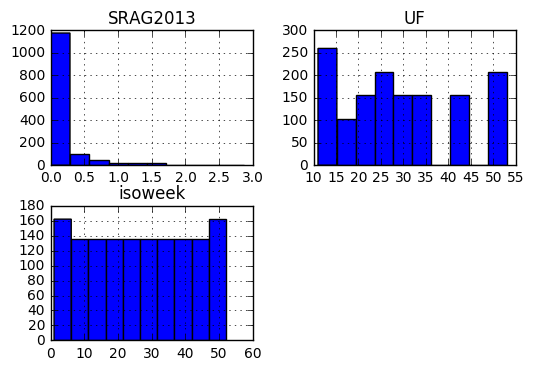

In [7]:
display(df_incidence.head())

df_incidence.hist()
plt.show()

,UF,População,isoweek,corredor_baixo,corredor_mediano,corredor_alto,Unidade_da_Federação
0,11,1768204,1,0.0,0.000000,0.000000,Rondônia
1,11,1768204,2,0.0,0.000000,0.000000,Rondônia
2,11,1768204,3,0.0,0.169664,0.169664,Rondônia
3,11,1768204,4,0.0,0.056555,0.056555,Rondônia
4,11,1768204,5,0.0,0.056555,0.056555,Rondônia


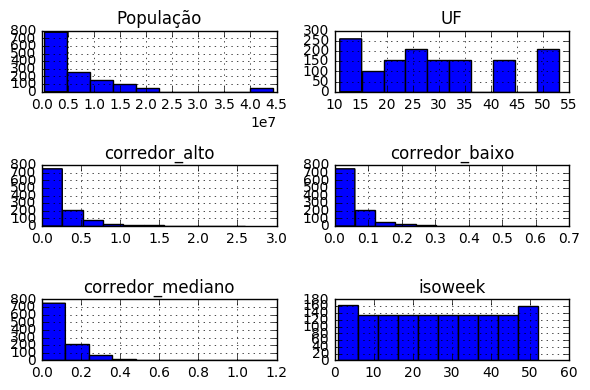

In [8]:
display(df_typical.head())

df_typical.hist()
plt.tight_layout()
plt.show()

In [9]:
df = pd.merge(
    df_incidence, df_typical, on=['UF', 'isoweek'], how='right'
).merge(
    df_thresholds.drop(['Unidade_da_Federação', 'População'], axis=1), 
    on='UF'
)
display(df.head(5))

,UF,isoweek,SRAG2013,População,corredor_baixo,corredor_mediano,corredor_alto,Unidade_da_Federação,Média_geométrica_do_pico_de_infecção_das_temporadas_regulares,limiar_pré_epidêmico,intensidade_alta,intensidade_muito_alta,se_típica_do_início_do_surto,IC_da_se_típica_do_início_do_surto,duração_típica_do_surto,IC_da_duração_típica_do_surto
0,11,1,0.0,1768204,0.0,0.000000,0.000000,Rondônia,0.140678,0.282773,0.565546,1.131091,12.0,[4.0-39.0],2.0,[0.0-8.0]
1,11,2,0.0,1768204,0.0,0.000000,0.000000,Rondônia,0.140678,0.282773,0.565546,1.131091,12.0,[4.0-39.0],2.0,[0.0-8.0]
2,11,3,0.0,1768204,0.0,0.169664,0.169664,Rondônia,0.140678,0.282773,0.565546,1.131091,12.0,[4.0-39.0],2.0,[0.0-8.0]
3,11,4,0.0,1768204,0.0,0.056555,0.056555,Rondônia,0.140678,0.282773,0.565546,1.131091,12.0,[4.0-39.0],2.0,[0.0-8.0]
4,11,5,0.0,1768204,0.0,0.056555,0.056555,Rondônia,0.140678,0.282773,0.565546,1.131091,12.0,[4.0-39.0],2.0,[0.0-8.0]


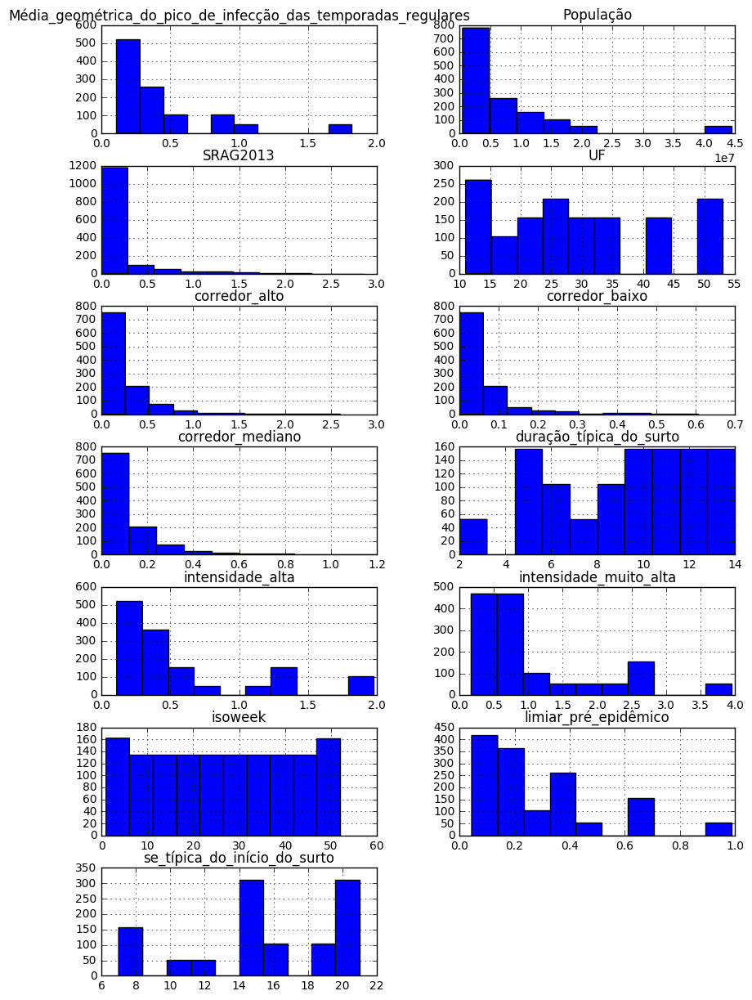

In [10]:
df.hist(layout=(7, 2), figsize=(10, 15))
# plt.tight_layout()
plt.show()

In [11]:
df_state_table = df[
    ['Unidade_da_Federação', 'UF']
].drop_duplicates().reset_index(drop=True)

df_state_table

,Unidade_da_Federação,UF
0,Rondônia,11
1,Acre,12
2,Amazonas,13
3,Roraima,14
4,Pará,15
5,Amapá,16
6,Tocantins,17
7,Maranhão,21
8,Piauí,22
9,Ceará,23


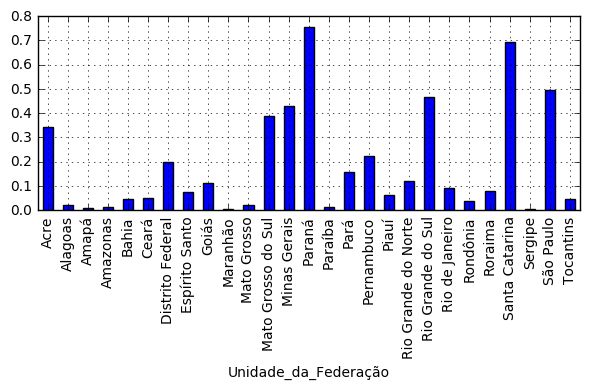

In [12]:
df_state = df.groupby(['Unidade_da_Federação'])['SRAG2013'].mean()

df_state.plot(kind='bar')
plt.tight_layout()
plt.grid(True)
plt.show()

## Time criteria

for a whole year criteria:

use the same procedure adopted by ECDC in their annual report. Which is:

* Red if the incidence was above the high threshold for at least 5 weeks;
* Orange if above the high threshold from 1 to 4 weeks;
* Yellow if crossed the epidemic threshold but not the high one;
* Green if it did not cross the epidemic threshold.

for a specific week criteria:

* Here, the levels are:
* Low: incidence < epidemic threshold
* Medium: epi. thresh. < incidence < high thresh.
* High: high thresh. < incidence < very high thresh.
* Very high: very high thresh. < incidence

So:

* low: green
* medium: yellow
* high: orange
* very high: red

In [13]:
def apply_filter_alert_by_isoweek(
    df, year, isoweek=None, verbose=False
):
    """
    """
    if isoweek is not None:
        mask = df.eval('isoweek=={}'.format(isoweek))
    else:
        mask = df.keys()

    df_alert = df[mask].reset_index()
    df_alert = df_alert.assign(incidence=df['SRAG{}'.format(year)])
    
    # * Low: incidence < epidemic threshold | green
    df_alert = df_alert.assign(
        low_incidence=lambda se: se.eval('incidence < limiar_pré_epidêmico')
    )

    # * Medium: epi. thresh. < incidence < high thresh. | yellow
    df_alert = df_alert.assign(
        medium_incidence=lambda se: se.eval(
            'limiar_pré_epidêmico <= incidence < intensidade_alta'
    ))

    # * High: high thresh. < incidence < very high thresh. | orange
    df_alert = df_alert.assign(
        high_incidence=lambda se: se.eval(
            'intensidade_alta <= incidence < intensidade_muito_alta '
    ))

    # * Very high: very high thresh. < incidence | red
    df_alert = df_alert.assign(
        very_high_incidence=lambda se: se.eval(
            'intensidade_muito_alta <= incidence'
    ))
    
    if verbose:
        display(df_alert[[
            'UF', 'Unidade_da_Federação',
            'low_incidence', 
            'medium_incidence',
            'high_incidence',
            'very_high_incidence'
        ]])
    
    # alert
    alert_col = df_alert.T.apply(
        lambda se: (
            4 if se.very_high_incidence else
            3 if se.high_incidence else
            2 if se.medium_incidence else
            1
        )
    )

    df_alert = df_alert.assign(alert=alert_col)
    
    if verbose:
        display(df_alert[['UF', 'Unidade_da_Federação', 'alert']])
        
    return df_alert

In [14]:
# filter by a specific week
year = 2013
isoweek = None

In [15]:
df_alert = apply_filter_alert_by_isoweek(df=df, year=year, isoweek=isoweek)

In [16]:
def chart_incidence_curve(
    df, season='SRAG2013', uf_name='Rio Grande do Sul',
    week=32
):
    """
    """
    df_by_uf = df[df['Unidade_da_Federação'] == uf_name]

    # Set figure size
    fig, ax = plt.subplots(1, 1, figsize = [20, 20])

    # Set ymax at least = 1:
    maxval1 = max(
        df_by_uf[[
            season, 'corredor_alto', 'intensidade_muito_alta'
        ]].max().max(), 1
    )
    ax.set_ylim([0,maxval1])

    # Plot lines and regions:
    ax.fill_between(
        df_by_uf['isoweek'], 0, df_by_uf['corredor_baixo'], 
        color='green', alpha=0.5
    )
    ax.fill_between(
        df_by_uf['isoweek'], df_by_uf['corredor_baixo'], 
        df_by_uf['corredor_mediano'], color='yellow', alpha=0.5
    )
    ax.fill_between(
        df_by_uf['isoweek'], df_by_uf['corredor_mediano'], 
        df_by_uf['corredor_alto'], color='orange', alpha=0.5
    )
    
    _conf = {
        'ax': ax,
        'x': 'isoweek',
    }
    
    df_by_uf.plot(y=season, color='k', lw=3, **_conf)
    df_by_uf.plot(y='limiar_pré_epidêmico', style='--', lw=3, **_conf)
    df_by_uf.plot(y='intensidade_alta', style='--', lw=3,  **_conf)
    df_by_uf.plot(y='intensidade_muito_alta', style='--', lw=3,  **_conf)
    df_by_uf.plot(y='corredor_alto', legend=False, alpha=0,  **_conf)

    # Grab ylim in order to set the range for the red zone:
    miny, maxy = ax.get_ylim()
    del(ax.lines[-1])
    ax.fill_between(
        df_by_uf['isoweek'], df_by_uf['corredor_alto'], maxy, 
        color='red', alpha=0.5
    )
    ax.set_ylim([miny, maxy])

    # Draw vertical line indicating user selected week:
    plt.axvline(axes=ax, x=week, color='silver', lw=8, alpha=0.5)

    # Use defined font properties for axis tick labels
    for label in ax.get_xticklabels() :
        label.set_fontproperties(fontpropticks)    
    for label in ax.get_yticklabels() :
        label.set_fontproperties(fontpropticks)

    ax.set_title(uf_name, fontproperties=fontproplbl)
    ax.set_xlabel('SE', fontproperties=fontproplbl)
    ax.set_ylabel(
        'Incidência (por 100mil habitantes)', fontproperties=fontproplbl
    )
    xticks = np.arange(4,53,4)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)

    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(prop=fontproplgd, loc='center left', bbox_to_anchor=(1,0.5))
    plt.show()


Type the UF code (Leave this empty to finish):11
Type the week number (default=25):
Selected UF: 11 - Rondônia (week=25)


/home/xmn/anaconda3/envs/fludashboard/lib/python3.5/site-packages/matplotlib/font_manager.py:1288: UserWarning: findfont: Font family ['Oswald'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


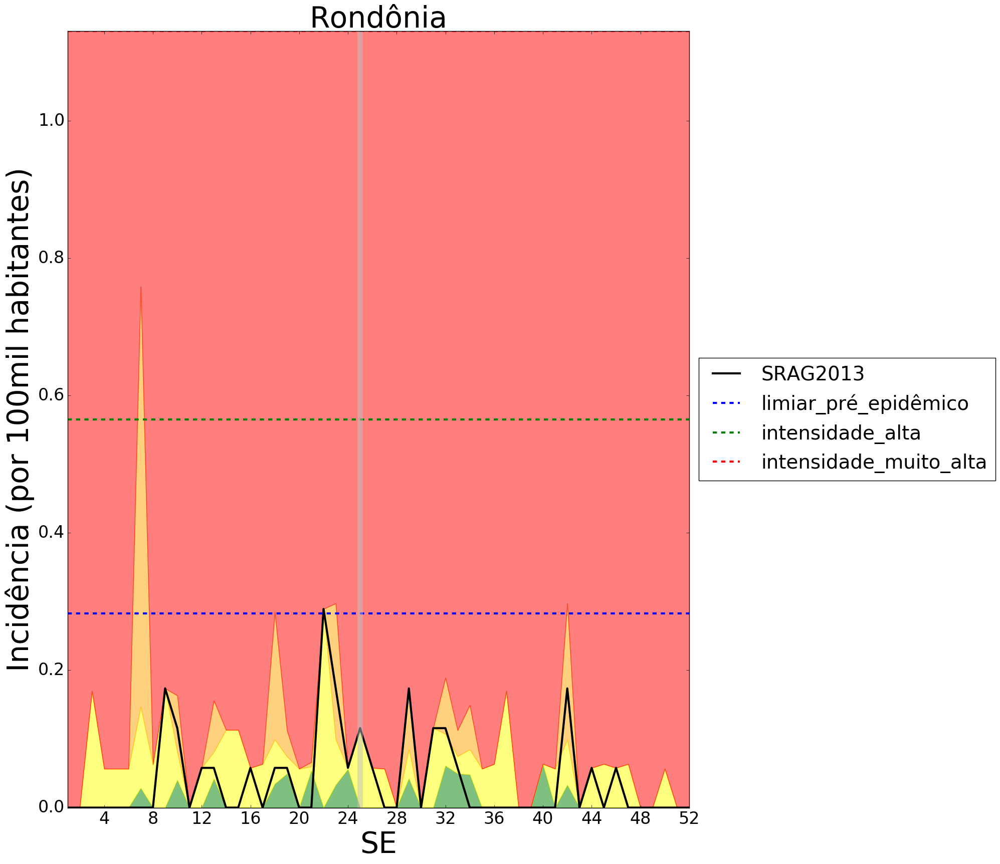


Type the UF code (Leave this empty to finish):
Finished.


In [23]:
# display(df_alert[['UF', 'Unidade_da_Federação']])

while True:
    print('')
    _uf = input('Type the UF code (Leave this empty to finish):')
    
    if not _uf:
        print('Finished.')
        break
        
    try:
        uf = int(_uf)
        
        if uf not in df_alert.UF.values:
            raise ValueError()
    except ValueError:
        print('Selected UF not found!')
        continue
        
    try:
        week = int(input('Type the week number (default=25):'))
    except:
        week = 25
        
    uf_name = str(df_alert[df_alert.UF==uf]['Unidade_da_Federação'].values[0])
    
    print('Selected UF: {} - {} (week={})'.format(uf, uf_name, week))
    chart_incidence_curve(
        df=df, season='SRAG2013', uf_name=uf_name, week=week
    )
    

In [18]:
with open('../prototype/data/br-states.json') as f:
    br_states = f.read()

In [26]:
# bind date to js template
with open('template.html') as f:
    html_template = jinja2.Template(f.read())
    
# push data to notebook
# display(df_alert.keys())
inline_html(html_template.render(
    data=df_alert.to_json(orient='records'),
    br_states=br_states,
    current_isoweek=datetime.datetime.now().isocalendar()[1]
))

State,Incidence


## References

http://stackoverflow.com/questions/16766986/is-it-possible-to-group-by-multiple-dimensions-in-crossfilter